<a href="https://colab.research.google.com/github/JothilakshmiN/repository1/blob/master/ML_Intremediate__Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt 
%matplotlib inline 
import pandas as pd
from datetime import datetime

import seaborn as sns
sns.set()


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
store_ds  =  pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-3/master/Projects/Store_Item_demand_forecast.csv')
store_ds.head()

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [0]:
store_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


In [0]:
store_ds.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [0]:
#@title
# !pip install pandas_profiling==2.5.0

In [0]:
# import pandas_profiling

# from pandas_profiling import ProfileReport

# profile = ProfileReport(store_ds)

# profile.to_file(output_file = "StoreItem_DS info before preprocessing.html")

# **Pandas Profiling before Data Preprocessing**

### Data Set Info
Number of variables  =  4 <br>
Number of Observation = 913000 <br>
Missing cells = 0% <br>
Duplicate rows = 0 <br>

### Variable types
1.NUMERICAL -	3 <br>2. Categorical 	1 

- Date is high cardinality . Type- Date
- Store min = 1 max = 10 median = 5.5 no Skewness
- Item  min = 1 max = 50 median = 25.5 no Skewness
- Sale min = 0 max = 231 median = 47 ,Right Skewed
 





### **Problem Statement :**

How sales impact in each store with respect to item and season .

so that we can suggest the stores to increase sales of item 

---



In [0]:
from datetime import datetime

store_ds['date']  =  pd.to_datetime(store_ds['date'],infer_datetime_format = True)             #convert from string to datetime

# DateIndexed_storeDS  =  store_ds.set_index(['date'])
# DateIndexed_storeDS.head(5)

In [12]:
store_ds_gr= store_ds[store_ds['store'].isin([1,2,3,4,5])]
DateIndexed_store_ds_gr  =  store_ds_gr.set_index(['date'])
DateIndexed_store_ds_gr.head(5)

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10


In [26]:
import plotly.graph_objs as go

dfg = DateIndexed_store_ds_gr.groupby(['date'])['sales'].sum()

fig = go.Figure()
fig.add_trace(go.Scatter(x=dfg.index,y=dfg['sales'],name="Example graph",line_color='deepskyblue',opacity=0.8))
fig.show()


KeyError: ignored

In [0]:
# store_ds_gr = store_ds_gr[store_ds_gr['sales'] >= 200]

In [17]:
store_ds_gr.groupby(['item','date'])['sales'].value_counts()
# .plot.bar(figsize=(20,7), colormap='viridis', fontsize=13) 
# plt.xlabel('sales')
# plt.ylabel('count')
# #plt.title('Car, body and model Vs count')

item  date        sales
1     2013-01-01  10       1
                  11       1
                  12       1
                  13       1
                  19       1
                          ..
50    2017-12-31  36       1
                  45       1
                  73       1
                  77       1
                  81       1
Name: sales, Length: 435905, dtype: int64

In [20]:
import numpy as np
import plotly.graph_objs as go
import pandas as pd
from datetime import datetime
dfg = DateIndexed_storeDS.groupby(['date'])['sales'].value_counts()
dfg


# d ={'Date': [datetime(2019, 5, 23)]*7+ [datetime(2019, 5,24)]*2+ [datetime(2019, 7, 1), datetime(2020, 1, 11)],
#     'Quantity' : [1, 4, 2,  4, 4, 4, 4,7,  1, 1, 3]}


# df = pd.DataFrame(d)
# dfg = df.groupby(['Date']).sum()




# fig = go.Figure()
# fig.add_trace(go.Scatter(
#                 x=dfg.index,
#                 y=dfg['Quantity'],
#                 name="Example graph",
#                 line_color='deepskyblue',
#                 opacity=0.8))


# import plotly.express as px
# df = px.data.gapminder()
# fig = px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
#            size="pop", color="continent", hover_name="country", facet_col="continent",
#            log_x=True, size_max=45, range_x=[100,100000], range_y=[25,90])
# fig.show()

NameError: ignored

In [0]:
import plotly.express as px
fig = px.line(store_ds, x='date', y='sales')
fig.show()

In [0]:
split_storeDS = store_ds[['date','sales']]
split_storeDS.head()

,date,sales
0,2013-01-01,13
1,2013-01-02,11
2,2013-01-03,14
3,2013-01-04,13
4,2013-01-05,10


In [0]:
import plotly.graph_objs as go
layout = go.Layout(title='sales Plot', xaxis=dict(title='Date'),
                   yaxis=dict(title='(salescount)'))

In [0]:
import plotly.graph_objs as go
fig = go.Figure(data=[split_storeDS], layout=layout)

py.iplot(fig, sharing='public')

ValueError: ignored

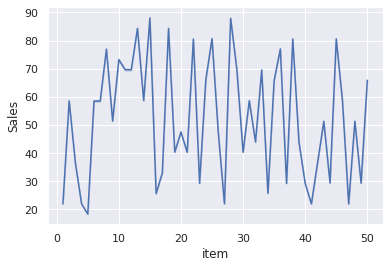

In [0]:
sns.lineplot(x = 'item', y = 'sales', data = store_ds)
plt.xlabel('item')
plt.ylabel('Sales')
plt.show()

In [0]:
# from pandas import datetime
# from matplotlib import pyplot
 
# def parser(x):
# 	return datetime.strptime('190'+x, '%Y-%m')
 
# series =pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-3/master/Projects/Store_Item_demand_forecast.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
# print(series)
# # series.plot(kind='line')
# # pyplot.show()
# sns.lineplot(x = 'item', y = 'sales', data = series)
# plt.xlabel('item')
# plt.ylabel('Sales')
# plt.show()

Text(0.5, 1.0, 'Scatter plot showing the variation of item with store ')

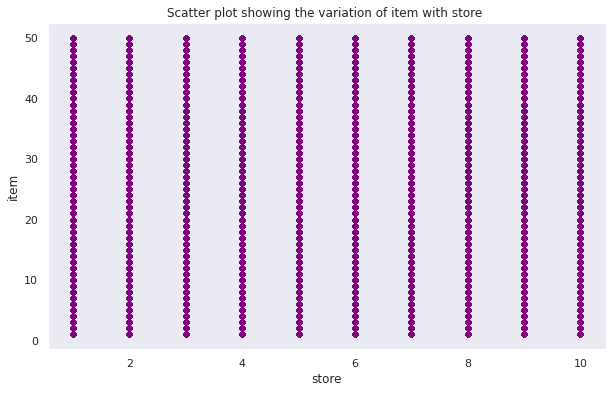

In [0]:
store_ds.plot(kind='scatter', x='store', y='item', figsize=(10, 6), color='purple', grid=False)

plt.title('Scatter plot showing the variation of item with store ')

In [0]:
store_No1 = store_ds.loc[(store_ds['store']) ==1]
store_No1

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
896561,2017-12-27,1,50,38
896562,2017-12-28,1,50,52
896563,2017-12-29,1,50,59
896564,2017-12-30,1,50,66


Text(0.5, 1.0, 'Scatter plot showing the variation of item with store ')

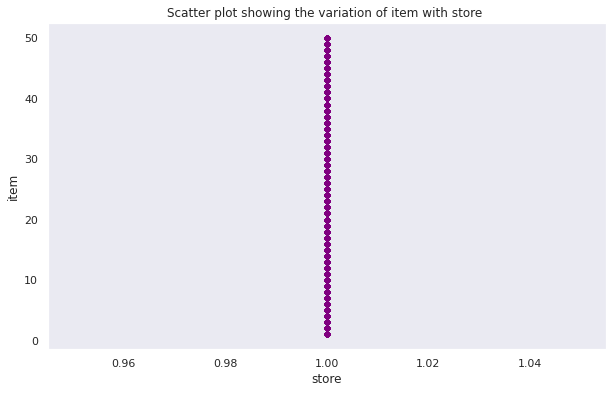

In [0]:
# store_No1.groupby(['store'])['item'].count().plot(kind='line', figsize=(15, 7), color='green')
store_No1.plot(kind='scatter', x='store', y='item', figsize=(10, 6), color='purple', grid=False)

plt.title('Scatter plot showing the variation of item with store ')

In [0]:
DateIndexed_storeDS.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 913000 entries, 2013-01-01 to 2017-12-31
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   store   913000 non-null  int64
 1   item    913000 non-null  int64
 2   sales   913000 non-null  int64
dtypes: int64(3)
memory usage: 27.9 MB


In [0]:
from datetime import datetime

split_storeDS['date']  =  pd.to_datetime(split_storeDS['date'],infer_datetime_format = True)             #convert from string to datetime

Indexed_splitstoreDS  =  split_storeDS.set_index(['date'])
Indexed_splitstoreDS.head(5)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,sales
date,
2013-01-01,13
2013-01-02,11
2013-01-03,14
2013-01-04,13
2013-01-05,10


In [0]:
Indexed_splitstoreDS_6monthsdata = Indexed_splitstoreDS.loc['2017-07-01' : '2017-12-31']
Indexed_splitstoreDS_6monthsdata
#df_time.loc['2017-11-02 23:00' : '2017-12-01'].head()

,sales
date,
2017-07-01,31
2017-07-02,38
2017-07-03,18
2017-07-04,23
2017-07-05,23
...,...
2017-12-27,63
2017-12-28,59
2017-12-29,74


In [0]:
Indexed_splitstoreDS_8monthsdata = Indexed_splitstoreDS.loc['2017-05-01' : '2017-12-31']
Indexed_splitstoreDS_8monthsdata.head()
#df_time.loc['2017-11-02 23:00' : '2017-12-01'].head()

,sales
date,
2017-05-01,15
2017-05-02,21
2017-05-03,29
2017-05-04,19
2017-05-05,28


In [0]:
Indexed_splitstoreDS_4monthsdata = Indexed_splitstoreDS.loc['2017-09-01' : '2017-12-31']
Indexed_splitstoreDS_4monthsdata.head()

,sales
date,
2017-09-01,38
2017-09-02,26
2017-09-03,23
2017-09-04,12
2017-09-05,26


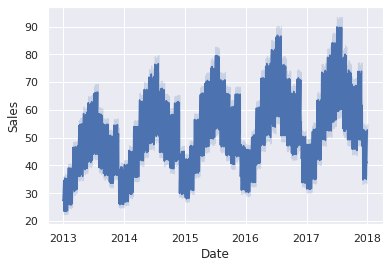

In [0]:
import matplotlib.pylab as plt 
%matplotlib inline                        
import seaborn as sns
sns.lineplot(x = 'date', y = 'sales', data = split_storeDS)
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()


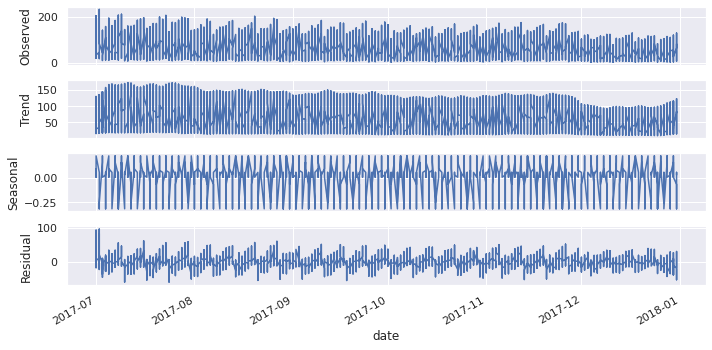

In [0]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize']  =  10, 5

from statsmodels.tsa.seasonal import seasonal_decompose
decomposed_dataset  =  seasonal_decompose(Indexed_splitstoreDS_6monthsdata, model = 'additive', freq=10)      
#seasonal_decompose(Ts, model = 'additive', freq=1)   
figure  =  decomposed_dataset.plot()
plt.show()

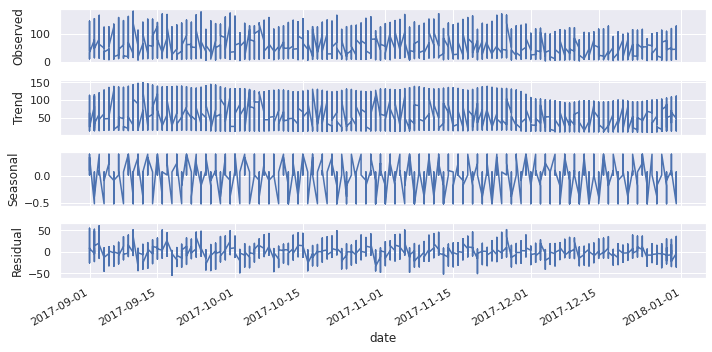

In [0]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize']  =  10, 5

from statsmodels.tsa.seasonal import seasonal_decompose
decomposed_dataset  =  seasonal_decompose(Indexed_splitstoreDS_4monthsdata, model = 'additive', freq=10)      
#seasonal_decompose(Ts, model = 'additive', freq=1)   
figure  =  decomposed_dataset.plot()
plt.show()

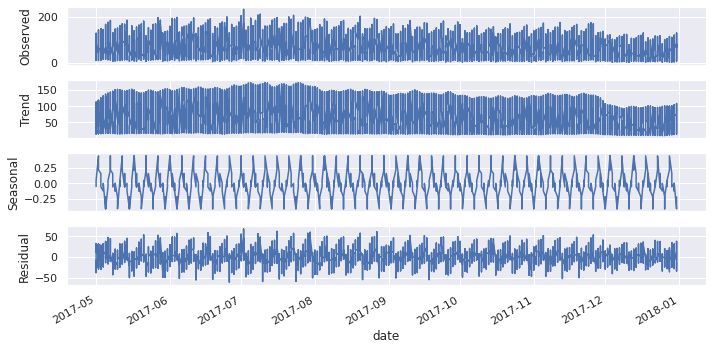

In [0]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize']  =  10, 5

from statsmodels.tsa.seasonal import seasonal_decompose
decomposed_dataset  =  seasonal_decompose(Indexed_splitstoreDS_8monthsdata, model = 'additive', freq=10)      
#seasonal_decompose(Ts, model = 'additive', freq=1)   
figure  =  decomposed_dataset.plot()
plt.show()

In [0]:
# Determine rolling statistics
def rolling_means(time_series):
    rolmean  =  time_series.rolling(window = 12).mean()    #window size 12 denotes 12 months, giving rolling mean at yearly level
    rolstd  =  time_series.rolling(window = 12).std()

    #Plot rolling statistics

    rcParams['figure.figsize']  =  10, 5 

    orig  =  plt.plot(time_series, color = 'blue', label = 'Original')
    mean  =  plt.plot(rolmean, color = 'red', label = 'Rolling Mean')
    std  =  plt.plot(rolstd, color = 'black', label = 'Rolling Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block = False)

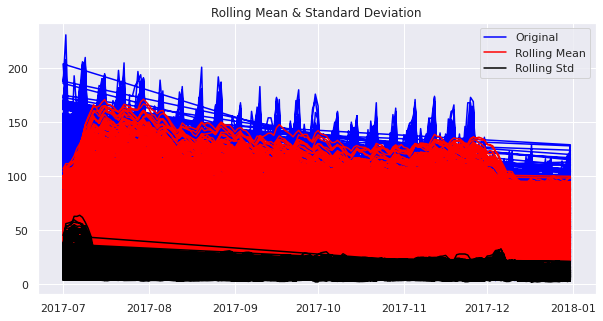

In [0]:
rolling_means(Indexed_splitstoreDS_6monthsdata)

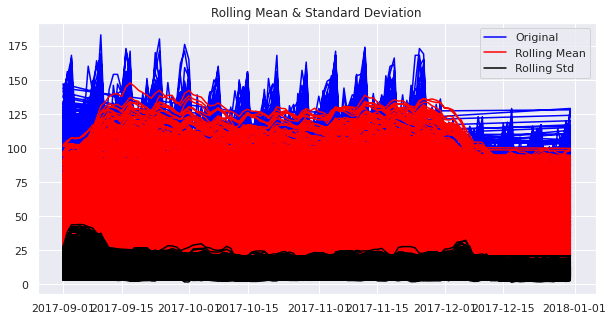

In [0]:
rolling_means(Indexed_splitstoreDS_4monthsdata)

In [0]:
#Perform Augmented Dickey–Fuller test:
def adf_test(time_series):
    from statsmodels.tsa.stattools import adfuller
    dftest  =  adfuller(time_series['sales'], autolag = 'AIC')

    dfoutput  =  pd.Series(dftest[0:4], index = ['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]  =  value
    
    print('Results of Dickey Fuller Test:')    
    print(dfoutput)

In [0]:
adf_test(Indexed_splitstoreDS_6monthsdata)

Results of Dickey Fuller Test:
Test Statistic                -1.026263e+01
p-value                        4.197808e-18
#Lags Used                     6.500000e+01
Number of Observations Used    9.193400e+04
Critical Value (1%)           -3.430421e+00
Critical Value (5%)           -2.861571e+00
Critical Value (10%)          -2.566787e+00
dtype: float64


In [0]:
adf_test(Indexed_splitstoreDS_4monthsdata)

Results of Dickey Fuller Test:
Test Statistic                -8.199843e+00
p-value                        7.280662e-13
#Lags Used                     6.000000e+01
Number of Observations Used    6.093900e+04
Critical Value (1%)           -3.430457e+00
Critical Value (5%)           -2.861587e+00
Critical Value (10%)          -2.566795e+00
dtype: float64


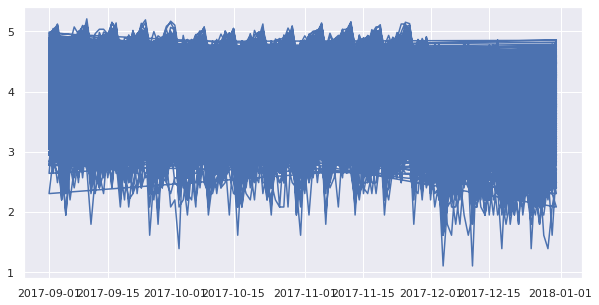

In [0]:
import numpy as np
Indexed_splitstoreDS_4monthsdata_logScale  =  np.log(Indexed_splitstoreDS_4monthsdata)
rcParams['figure.figsize']  =  10, 5
plt.plot(Indexed_splitstoreDS_4monthsdata_logScale)

In [0]:
def test_stationarity(time_series):
    rolling_means(time_series)
    adf_test(time_series)

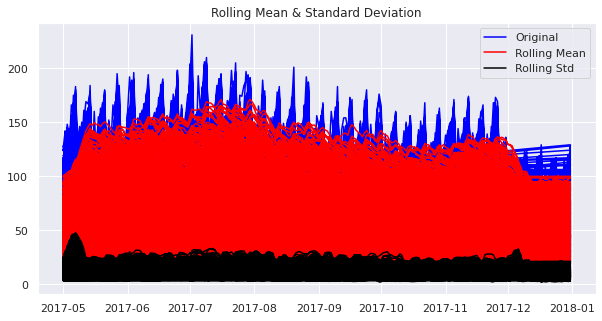

Results of Dickey Fuller Test:
Test Statistic                -1.254064e+01
p-value                        2.318668e-23
#Lags Used                     7.100000e+01
Number of Observations Used    1.224280e+05
Critical Value (1%)           -3.430403e+00
Critical Value (5%)           -2.861564e+00
Critical Value (10%)          -2.566783e+00
dtype: float64


In [0]:
test_stationarity(Indexed_splitstoreDS_8monthsdata)

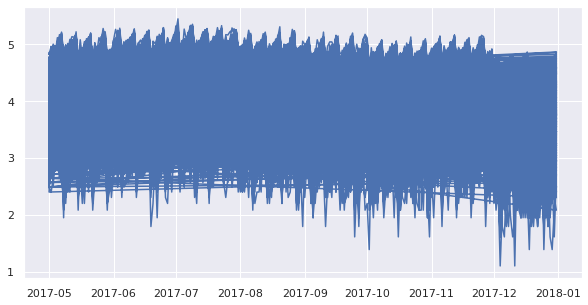

In [0]:
import numpy as np
Indexed_splitstoreDS_8monthsdata_logScale  =  np.log(Indexed_splitstoreDS_8monthsdata)
rcParams['figure.figsize']  =  10, 5
plt.plot(Indexed_splitstoreDS_8monthsdata_logScale)

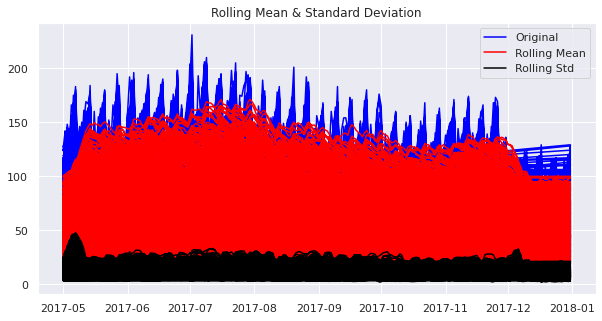

Results of Dickey Fuller Test:
Test Statistic                -1.254064e+01
p-value                        2.318668e-23
#Lags Used                     7.100000e+01
Number of Observations Used    1.224280e+05
Critical Value (1%)           -3.430403e+00
Critical Value (5%)           -2.861564e+00
Critical Value (10%)          -2.566783e+00
dtype: float64


In [0]:
test_stationarity(Indexed_splitstoreDS_8monthsdata)

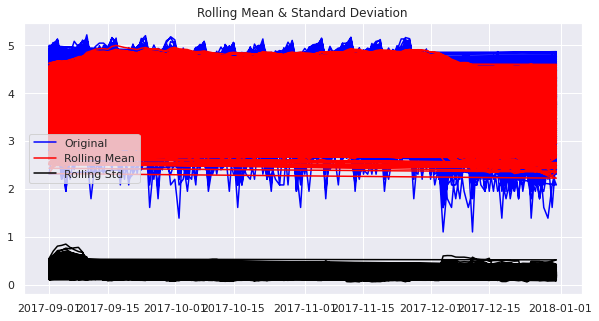

Results of Dickey Fuller Test:
Test Statistic                -7.558302e+00
p-value                        3.057569e-11
#Lags Used                     6.000000e+01
Number of Observations Used    6.093900e+04
Critical Value (1%)           -3.430457e+00
Critical Value (5%)           -2.861587e+00
Critical Value (10%)          -2.566795e+00
dtype: float64


In [0]:
test_stationarity(Indexed_splitstoreDS_4monthsdata_logScale)